In [30]:
data_test = data

In [31]:
import torch.nn as nn

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size, dropout_rate):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.dropout = nn.Dropout(dropout_rate)
        self.linear = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, (hn, cn) = self.lstm(x)
        out = self.dropout(out[:, -1, :]) 
        out = self.linear(out)
        return out


In [78]:
import numpy as np
import torch
import torch.optim as optim
import torch.nn as nn
from sklearn.metrics import mean_squared_error, mean_absolute_error
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

data = data[(data.index.month >= 1) & (data.index.month <= 11)]

def create_sequences_by_site(data, sequence_length):
    grouped = data.groupby(['site_latitude', 'site_longitude'])
    xs = []
    ys = []
    location_info = []  # Store location information
    hours = []          # Store accumulated hours information

    for (lat, lon), group in grouped:
        features = group[features_columns].values
        target = group[target_column].values
        hour_values = group['hour'].values  
        for i in range(len(group) - sequence_length):
            x = features[i:(i + sequence_length)]
            y = target[i + sequence_length]
            xs.append(x)
            ys.append(y)
            location_info.append((lat, lon))
            hours.append(hour_values[i + sequence_length])

    return np.array(xs), np.array(ys), location_info, hours

sequence_length = 2
X, y, locations, hours = create_sequences_by_site(data, sequence_length)



In [79]:
# Hyperparamters
n_splits = 4
input_size = X.shape[2]
hidden_size = 50
num_layers = 2
output_size = 1
epochs = 15
batch_size = 64
dropout_rate = 0.5

# Time Series Split Cross Validation
tss = TimeSeriesSplit(n_splits=n_splits)
metrics_results = []  # Store the results of each fold's metrics

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for fold, (train_idx, test_idx) in enumerate(tss.split(X)):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    scaler = StandardScaler()
    X_train_reshaped = X_train.reshape(-1, X_train.shape[-1]) 
    X_train_scaled = scaler.fit_transform(X_train_reshaped).reshape(X_train.shape)

    X_test_reshaped = X_test.reshape(-1, X_test.shape[-1])
    X_test_scaled = scaler.transform(X_test_reshaped).reshape(X_test.shape)

    #DataLoader
    train_data = TensorDataset(torch.tensor(X_train_scaled, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    test_data = TensorDataset(torch.tensor(X_test_scaled, dtype=torch.float32), torch.tensor(y_test, dtype=torch.float32))

    train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
    test_loader = DataLoader(test_data, batch_size=64, shuffle=False)


    # Models, loss functions and optimisers
    model = LSTMModel(input_size, hidden_size, num_layers, output_size, dropout_rate).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.01)

    fold_metrics = {
        'train_rmse': [], 'test_rmse': [],
        'train_mae': [], 'test_mae': [],
        'train_mape': [], 'test_mape': []
    }

    for epoch in range(epochs):
        #Train
        model.train()
        train_losses, train_mae, train_mape = [], [], []
        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            outputs = outputs.squeeze()
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_losses.append(loss.item())
            train_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.detach().cpu().numpy()))
            train_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.detach().cpu().numpy()) / targets.cpu().numpy())) * 100)

        fold_metrics['train_rmse'].append(np.sqrt(np.mean(train_losses)))
        fold_metrics['train_mae'].append(np.mean(train_mae))
        fold_metrics['train_mape'].append(np.mean(train_mape))

        #Test
        model.eval()
        test_losses, test_mae, test_mape = [], [], []
        with torch.no_grad():
            for inputs, targets in test_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                outputs = outputs.squeeze()
                loss = criterion(outputs, targets)
                test_losses.append(loss.item())
                test_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
                test_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        fold_metrics['test_rmse'].append(np.sqrt(np.mean(test_losses)))
        fold_metrics['test_mae'].append(np.mean(test_mae))
        fold_metrics['test_mape'].append(np.mean(test_mape))

        print(f'Fold {fold+1}, Epoch {epoch+1}/{epochs}, Train RMSE: {fold_metrics["train_rmse"][-1]:.4f}, Test RMSE: {fold_metrics["test_rmse"][-1]:.4f}')

    metrics_results.append(fold_metrics)

Fold 1, Epoch 1/15, Train RMSE: 18.1943, Test RMSE: 18.7033
Fold 1, Epoch 2/15, Train RMSE: 15.9209, Test RMSE: 18.2615
Fold 1, Epoch 3/15, Train RMSE: 15.3774, Test RMSE: 18.0643
Fold 1, Epoch 4/15, Train RMSE: 15.0102, Test RMSE: 17.8384
Fold 1, Epoch 5/15, Train RMSE: 14.7459, Test RMSE: 18.1155
Fold 1, Epoch 6/15, Train RMSE: 14.3989, Test RMSE: 18.4304
Fold 1, Epoch 7/15, Train RMSE: 14.1621, Test RMSE: 18.2811
Fold 1, Epoch 8/15, Train RMSE: 13.9180, Test RMSE: 18.3178
Fold 1, Epoch 9/15, Train RMSE: 13.7167, Test RMSE: 18.1818
Fold 1, Epoch 10/15, Train RMSE: 13.4798, Test RMSE: 17.7169
Fold 1, Epoch 11/15, Train RMSE: 13.2570, Test RMSE: 18.1527
Fold 1, Epoch 12/15, Train RMSE: 13.1016, Test RMSE: 18.4498
Fold 1, Epoch 13/15, Train RMSE: 12.9097, Test RMSE: 18.6597
Fold 1, Epoch 14/15, Train RMSE: 12.7476, Test RMSE: 18.1026
Fold 1, Epoch 15/15, Train RMSE: 12.6746, Test RMSE: 18.7984
Fold 2, Epoch 1/15, Train RMSE: 18.5121, Test RMSE: 15.9770
Fold 2, Epoch 2/15, Train RMSE: 16

In [80]:
import numpy as np

average_train_rmse_per_fold = [np.mean(fold_metrics['train_rmse']) for fold_metrics in metrics_results]
average_test_rmse_per_fold = [np.mean(fold_metrics['test_rmse']) for fold_metrics in metrics_results]

average_train_mae_per_fold = [np.mean(fold_metrics['train_mae']) for fold_metrics in metrics_results]
average_test_mae_per_fold = [np.mean(fold_metrics['test_mae']) for fold_metrics in metrics_results]

average_train_mape_per_fold = [np.mean(fold_metrics['train_mape']) for fold_metrics in metrics_results]
average_test_mape_per_fold = [np.mean(fold_metrics['test_mape']) for fold_metrics in metrics_results]

average_train_rmse_overall = np.mean(average_train_rmse_per_fold)
average_test_rmse_overall = np.mean(average_test_rmse_per_fold)

average_train_mae_overall = np.mean(average_train_mae_per_fold)
average_test_mae_overall = np.mean(average_test_mae_per_fold)

average_train_mape_overall = np.mean(average_train_mape_per_fold)
average_test_mape_overall = np.mean(average_test_mape_per_fold)


print("Train RMSE per fold:", average_train_rmse_per_fold)
print("Test RMSE per fold:", average_test_rmse_per_fold)
print("Train MAE per fold:", average_train_mae_per_fold)
print("Test MAE per fold:", average_test_mae_per_fold)
print("Train MAPE per fold:", average_train_mape_per_fold)
print("Test MAPE per fold:", average_test_mape_per_fold)
print("Overall average train RMSE:", average_train_rmse_overall)
print("Overall average test RMSE:", average_test_rmse_overall)
print("Overall average train MAE:", average_train_mae_overall)
print("Overall average test MAE:", average_test_mae_overall)
print("Overall average train MAPE:", average_train_mape_overall)
print("Overall average test MAPE:", average_test_mape_overall)


Train RMSE per fold: [14.240979386839578, 14.734129863940588, 14.070893503165394, 13.920104966500833]
Test RMSE per fold: [18.271612496566195, 14.94922112924951, 14.720555860737976, 15.559269677922426]
Train MAE per fold: [10.349311, 10.630315, 10.213199, 10.049896]
Test MAE per fold: [13.100844, 11.064473, 10.582903, 11.037625]
Train MAPE per fold: [50.79606606717083, 43.52458769155022, 40.98486936981248, 39.09050723182631]
Test MAPE per fold: [41.287909056948514, 42.20105345906883, 39.2891983708431, 40.43967423904901]
Overall average train RMSE: 14.241526930111597
Overall average test RMSE: 15.875164791119026
Overall average train MAE: 10.31068
Overall average test MAE: 11.446462
Overall average train MAPE: 43.59900759008996
Overall average test MAPE: 40.804458781477365


## For forecast - For 1 day

Test RMSE: 14.330873293056293
Test MAE: 9.637834
Test MAPE: 30.67518605126275


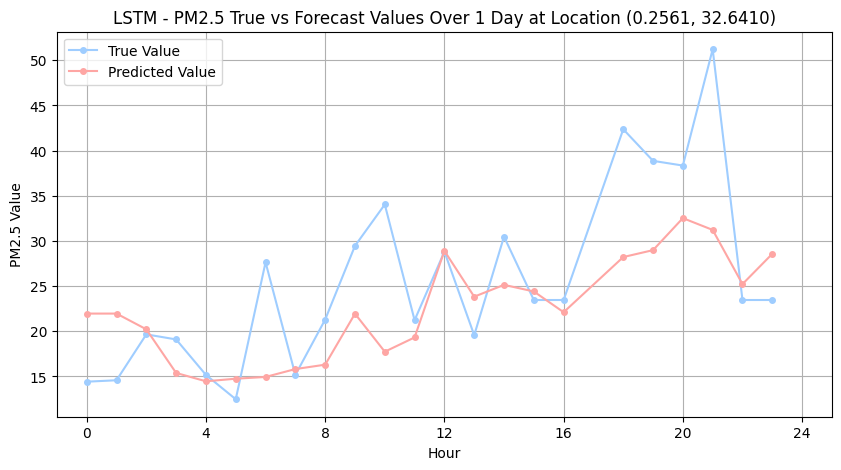

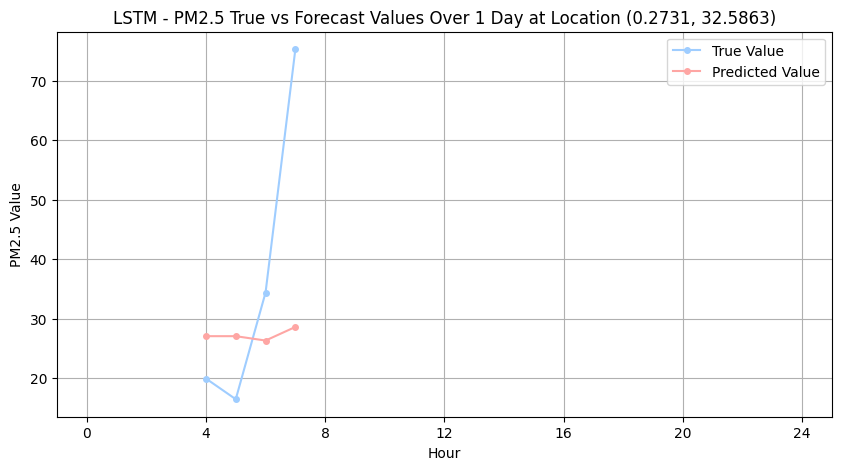

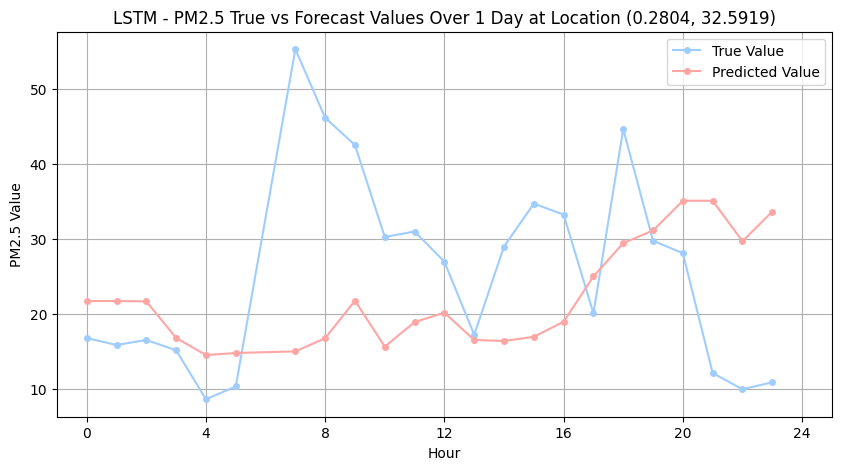

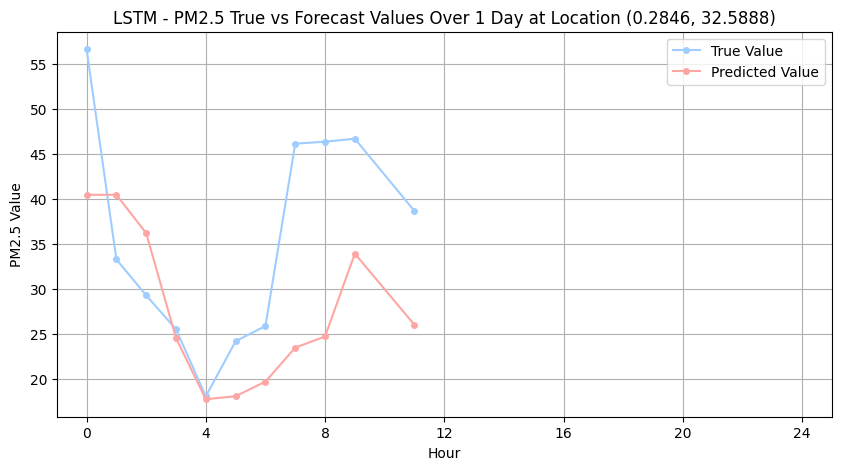

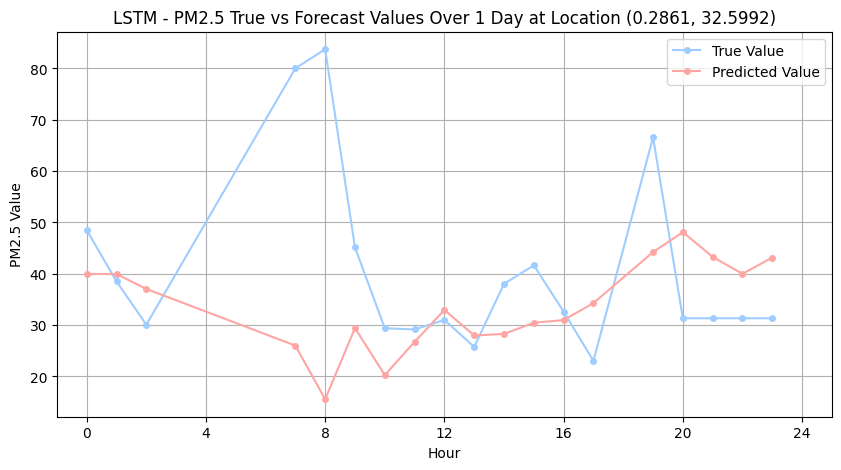

...

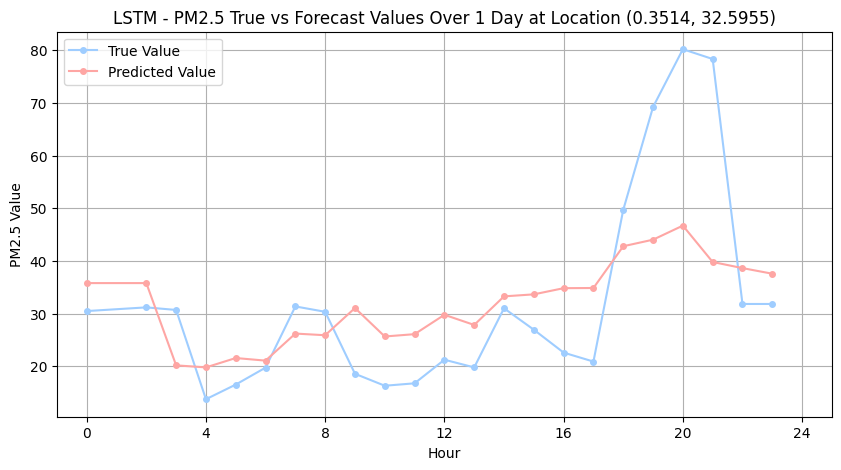

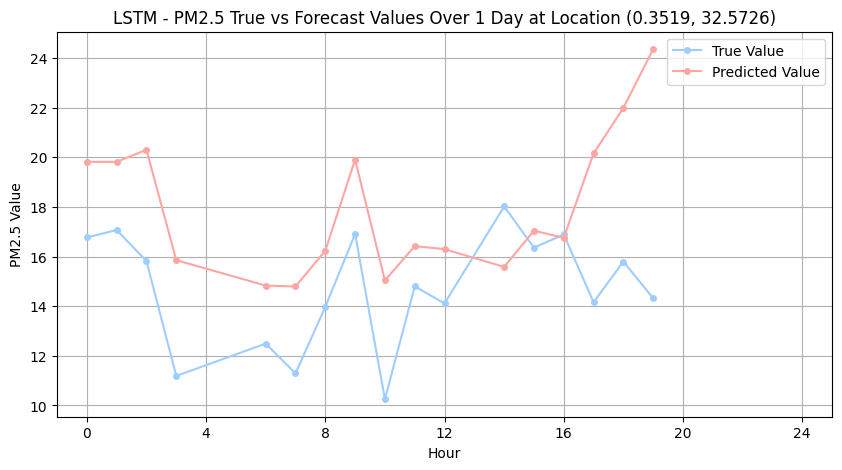

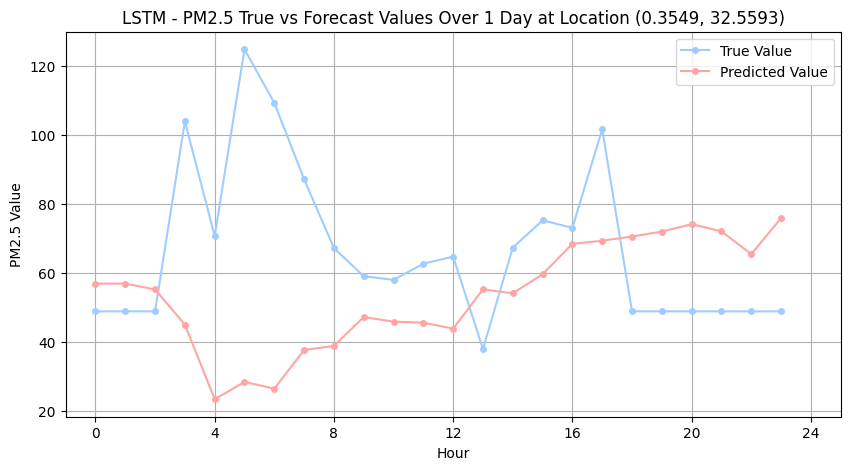

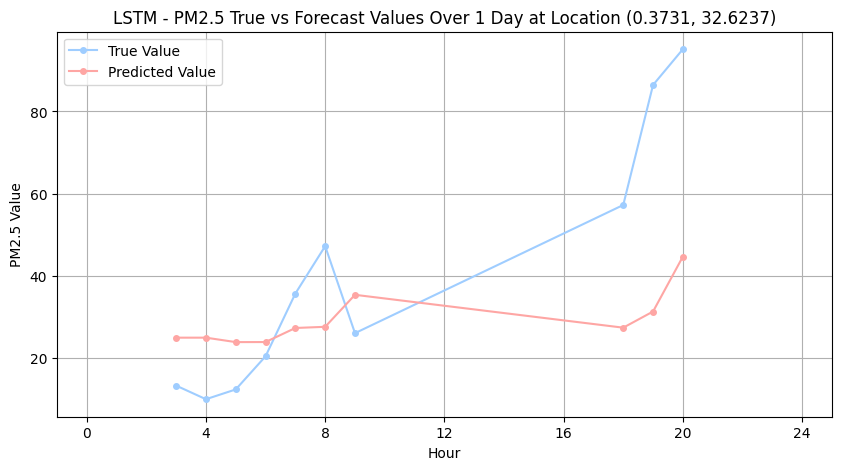

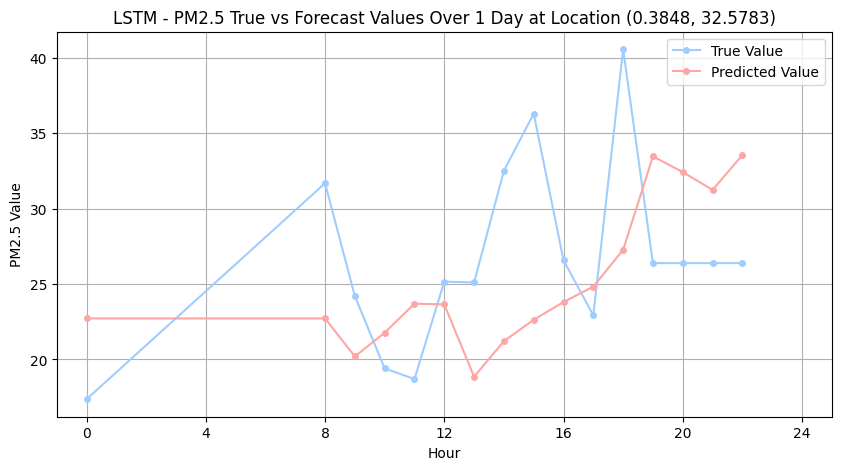

In [112]:
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day==1)]
grouped = data_test_day.groupby(['site_latitude', 'site_longitude'])

data_test_day_padded = pd.DataFrame()

for (lat, lon), group in grouped:
    initial_data = group.iloc[0:1]
    padding = pd.concat([initial_data]*sequence_length, ignore_index=True)
    padding.index = pd.date_range(end=initial_data.index[0] - pd.Timedelta(hours=1), periods=sequence_length, freq='h')
    padded_group = pd.concat([padding, group])
    
    padded_group['site_latitude'] = lat
    padded_group['site_longitude'] = lon
    
    data_test_day_padded = pd.concat([data_test_day_padded, padded_group])

data_test_day_padded.sort_index(inplace=True)


X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day_padded, sequence_length)
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)

test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)

offset = 0
all_predictions = []
all_targets = []
all_locations = []
all_hours = []

test_day_losses, test_day_mae, test_day_mape = [], [], []

model.eval()        
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)

        outputs = outputs.squeeze()

        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        all_targets.extend(targets.cpu().numpy())
        all_predictions.extend(outputs.cpu().numpy())

        batch_size = inputs.size(0)
        batch_indices = range(offset, offset + batch_size)
        all_locations.extend([locations[i] for i in batch_indices])
        all_hours.extend([hours[i] for i in batch_indices])

        offset += batch_size


print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))


# Plots
results_df = pd.DataFrame({
    'Latitude': [loc[0] for loc in all_locations],
    'Longitude': [loc[1] for loc in all_locations],
    'True Values': all_targets,
    'Predicted Values': all_predictions,
    'Hour': all_hours
})

grouped = results_df.groupby(['Latitude', 'Longitude'])
for (lat, lon), group in grouped:
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Values'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Values'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')
    plt.title(f"LSTM - PM2.5 True vs Forecast Values Over 1 Day at Location ({lat:.4f}, {lon:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks([0, 4, 8, 12, 16, 20, 24])
    plt.xlim(-1, 25)
    plt.legend()
    plt.grid(True)
    plt.show()




## For forecast - For 7 days

Test RMSE: 17.068388992953675
Test MAE: 12.21346
Test MAPE: 57.53510341696117


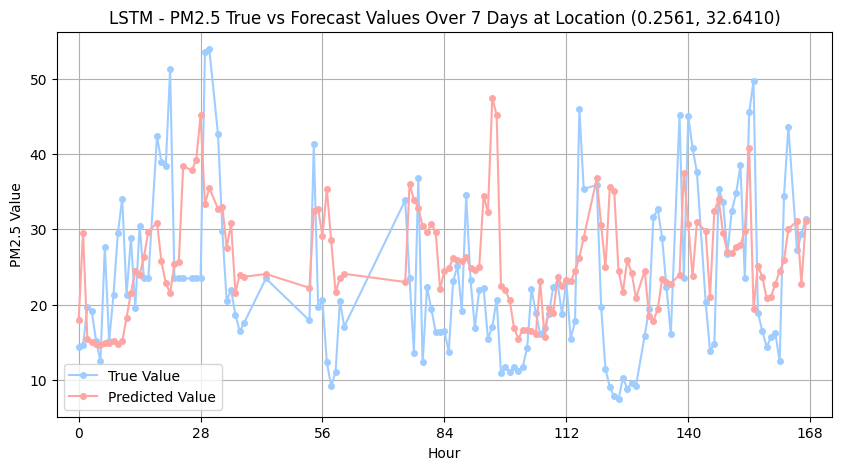

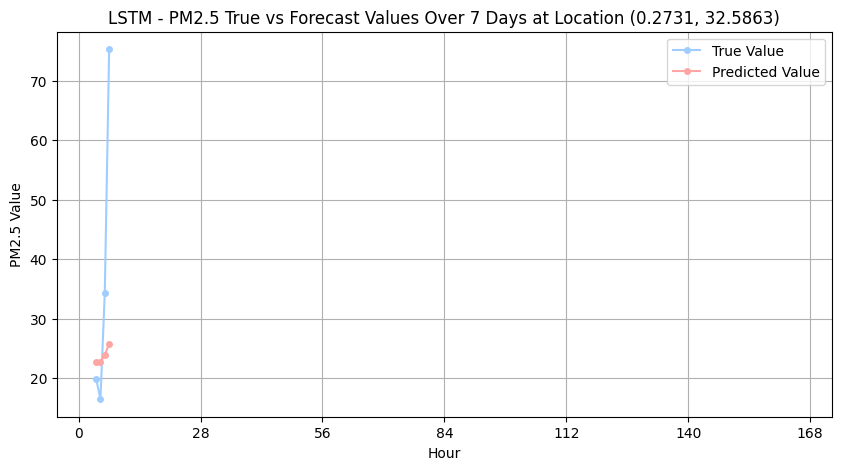

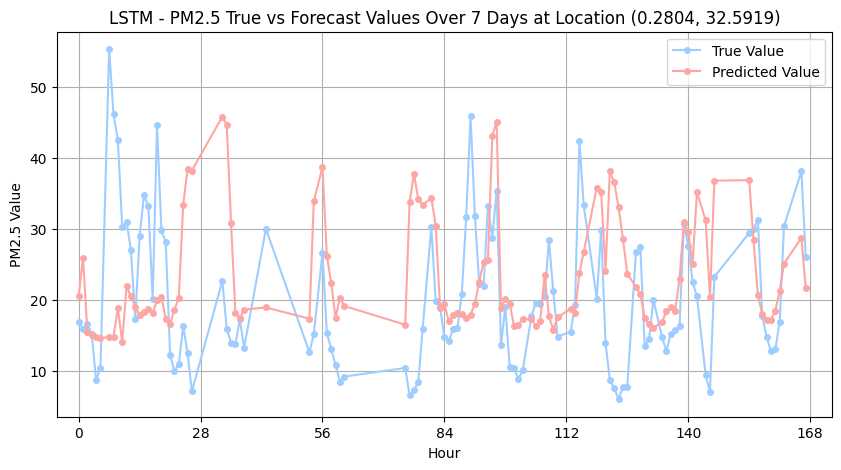

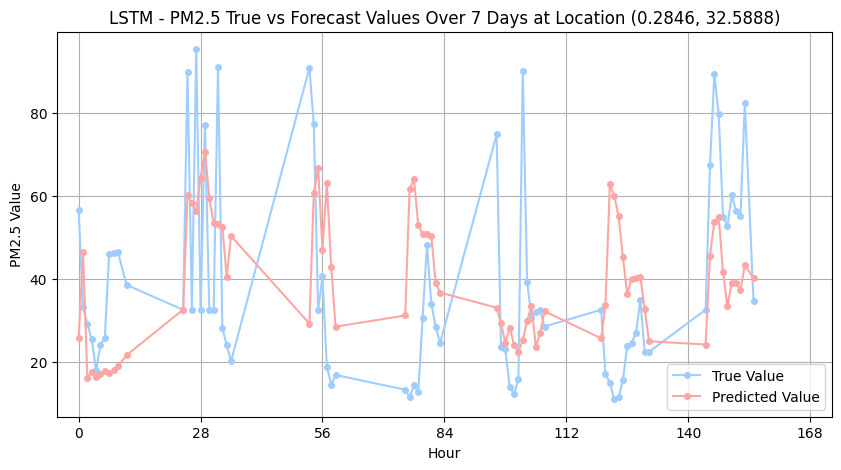

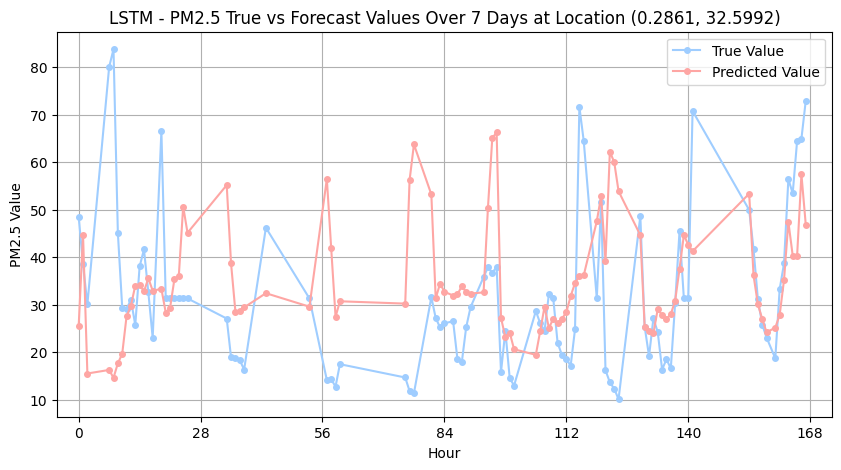

...

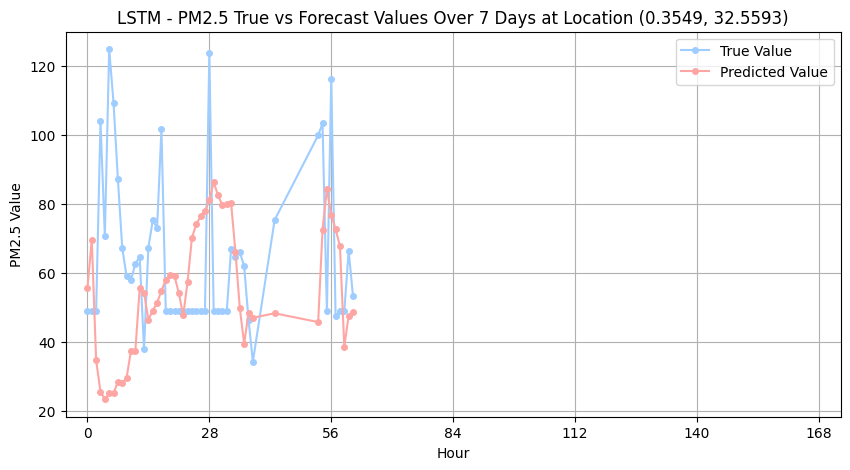

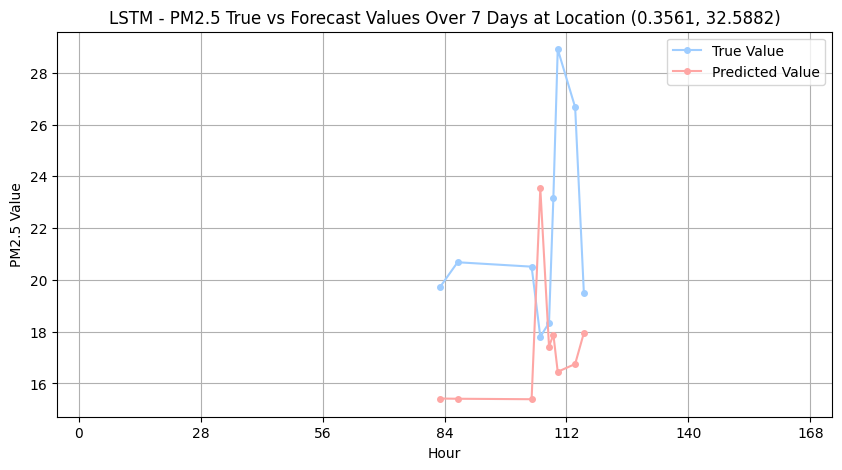

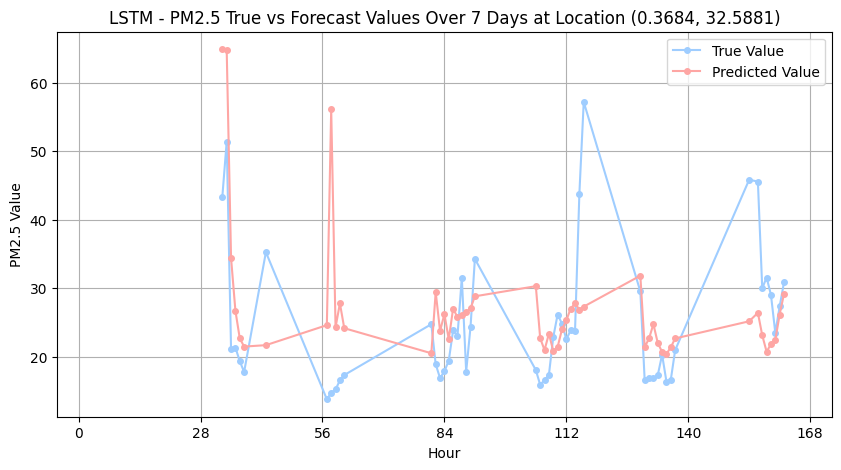

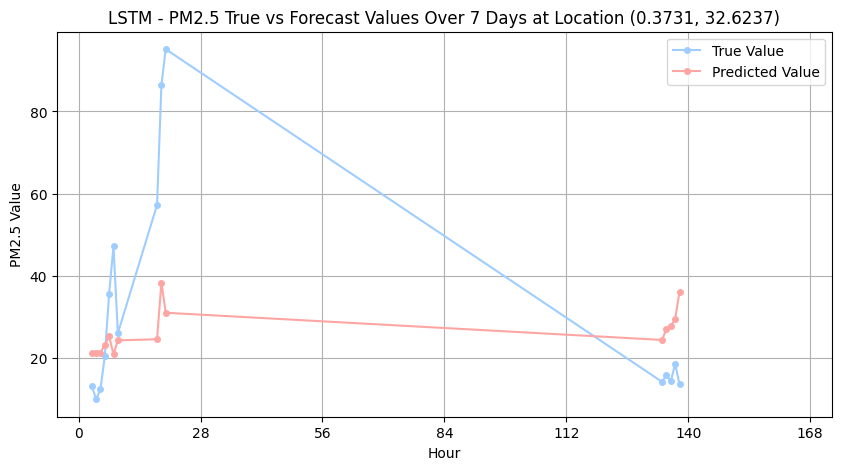

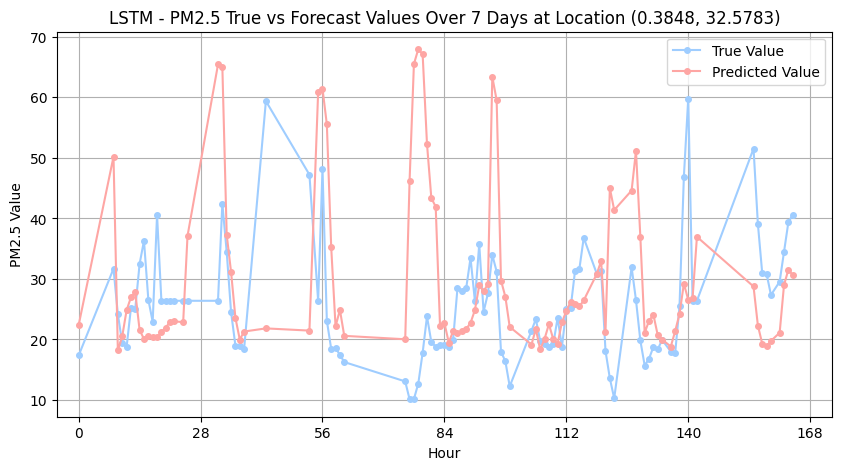

In [110]:
import pandas as pd
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=7)]
grouped = data_test_day.groupby(['site_latitude', 'site_longitude'])



data_test_day_padded = pd.DataFrame()

for (lat, lon), group in grouped:
    initial_data = group.iloc[0:1]
    padding = pd.concat([initial_data]*sequence_length, ignore_index=True)
    padding.index = pd.date_range(end=initial_data.index[0] - pd.Timedelta(hours=1), periods=sequence_length, freq='h')
    padded_group = pd.concat([padding, group])
    padded_group['site_latitude'] = lat
    padded_group['site_longitude'] = lon
    
    data_test_day_padded = pd.concat([data_test_day_padded, padded_group])


data_test_day_padded.sort_index(inplace=True)

data_test_day_padded['day'] = data_test_day_padded.index.day
min_day = data_test_day_padded['day'].min()
data_test_day_padded['hour'] = (data_test_day_padded['day'] - min_day) * 24 + data_test_day_padded.index.hour

X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day_padded, sequence_length)
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape) 

test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

#DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)

offset = 0 
all_predictions = []
all_targets = []
all_locations = []
all_hours = []

test_day_losses, test_day_mae, test_day_mape = [], [], []

model.eval()        
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)

        outputs = outputs.squeeze()

        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        all_targets.extend(targets.cpu().numpy())
        all_predictions.extend(outputs.cpu().numpy())

        batch_size = inputs.size(0)
        batch_indices = range(offset, offset + batch_size)
        all_locations.extend([locations[i] for i in batch_indices])
        all_hours.extend([hours[i] for i in batch_indices])

        offset += batch_size

print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))



results_df = pd.DataFrame({
    'Latitude': [loc[0] for loc in all_locations],
    'Longitude': [loc[1] for loc in all_locations],
    'True Values': all_targets,
    'Predicted Values': all_predictions,
    'Hour': all_hours
})

grouped = results_df.groupby(['Latitude', 'Longitude'])
for (lat, lon), group in grouped:
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Values'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Values'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')
    plt.title(f"LSTM - PM2.5 True vs Forecast Values Over 7 Days at Location ({lat:.4f}, {lon:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 169, 28))
    plt.xlim(-5, 173)
    plt.legend()
    plt.grid(True)
    plt.show()

## For forecast - For 30 days

Test RMSE: 17.38402589352944
Test MAE: 12.8896475
Test MAPE: 48.61867941997863


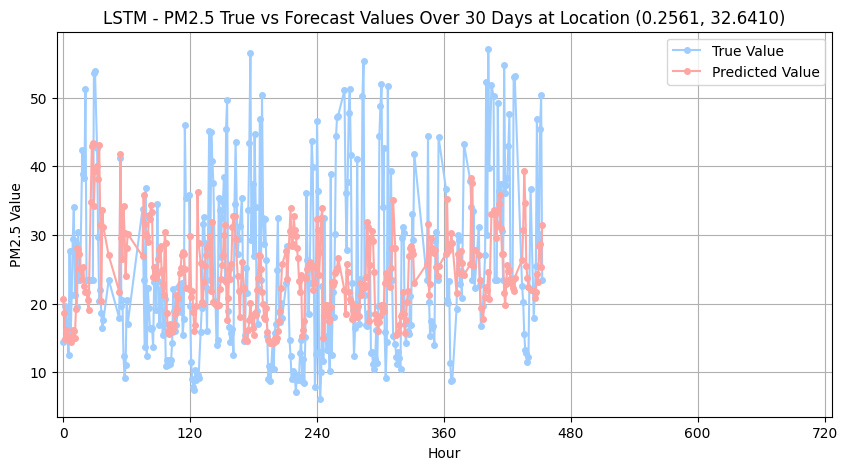

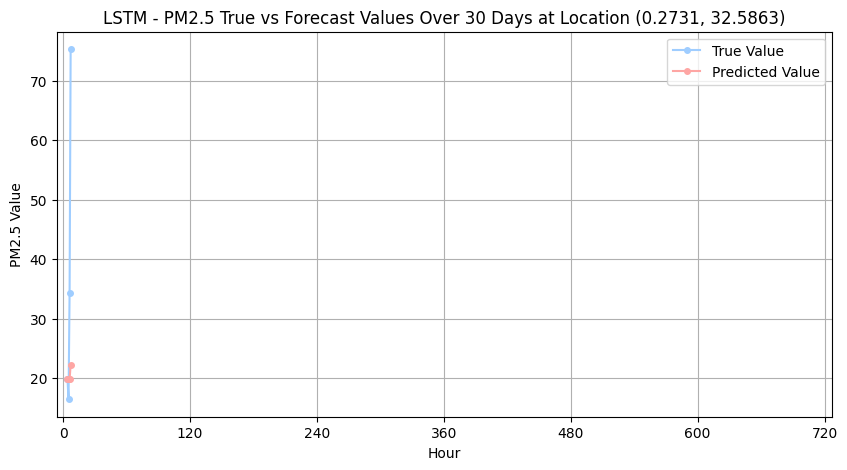

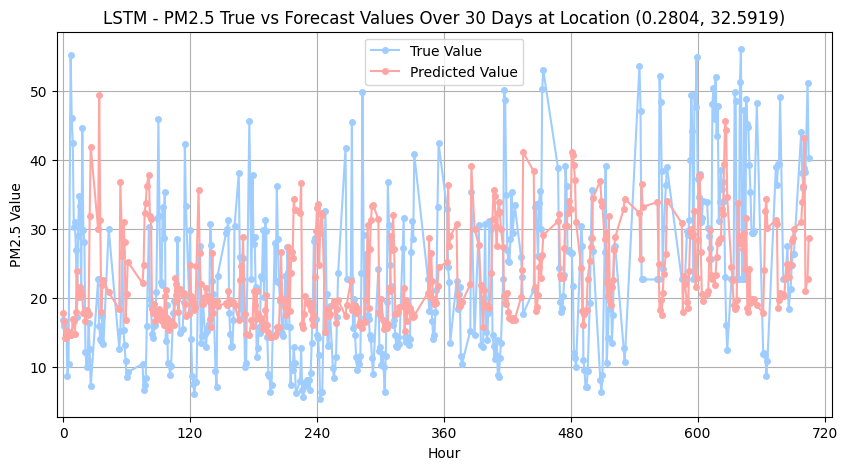

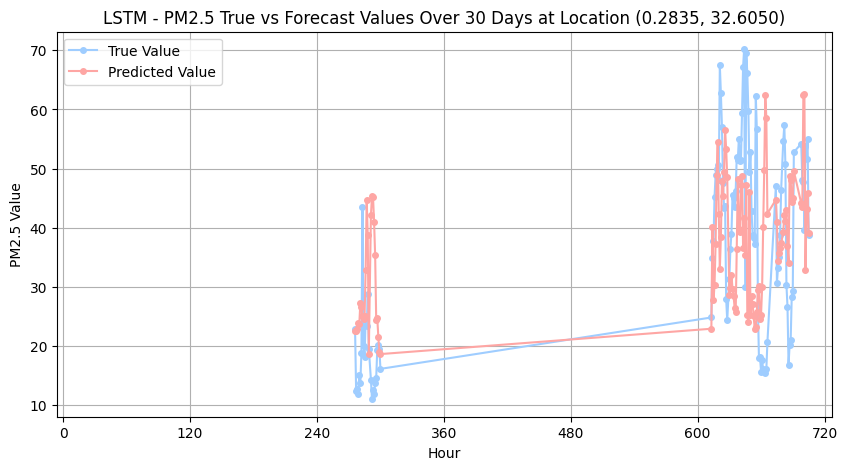

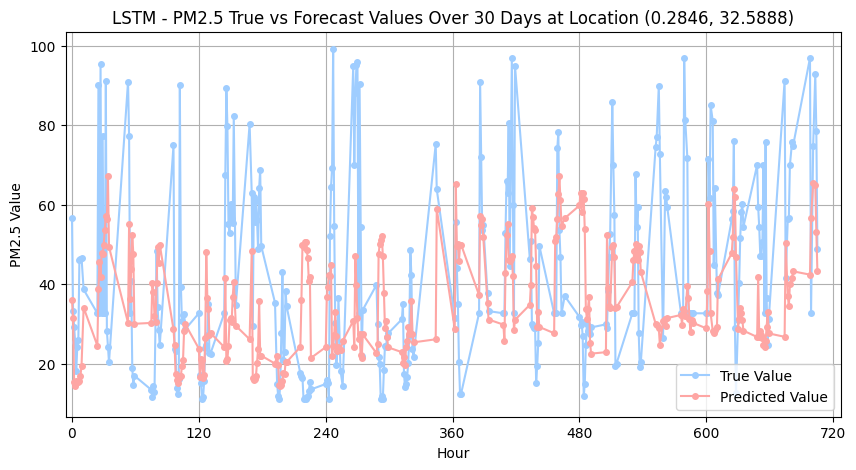

...

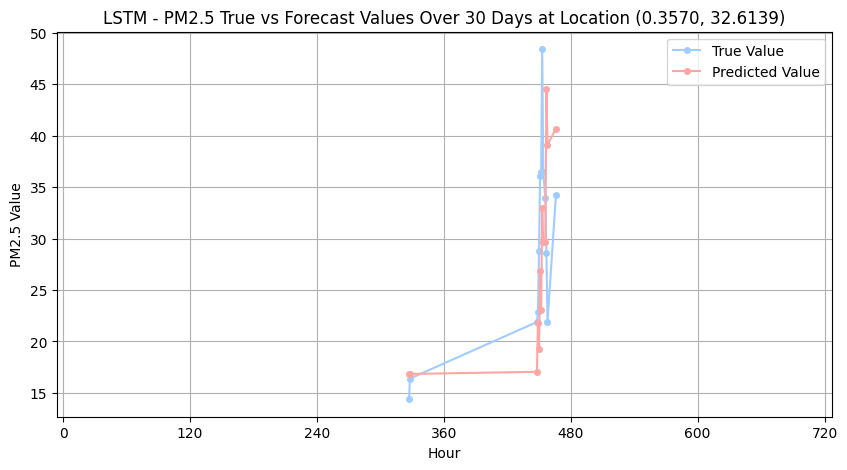

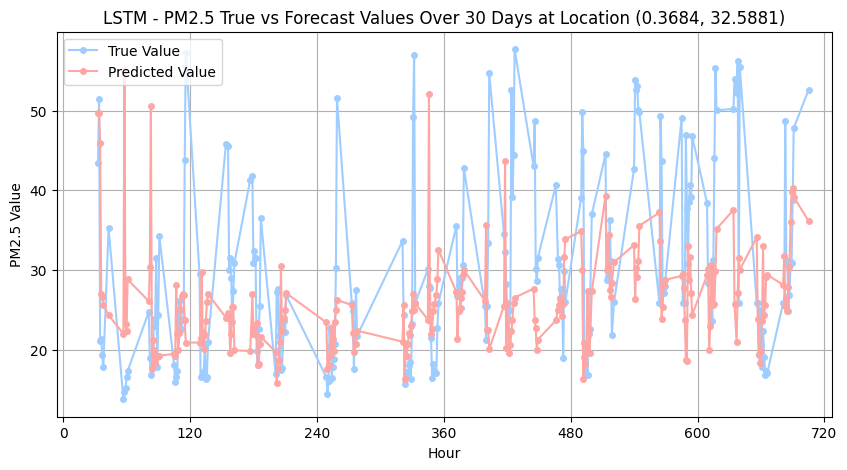

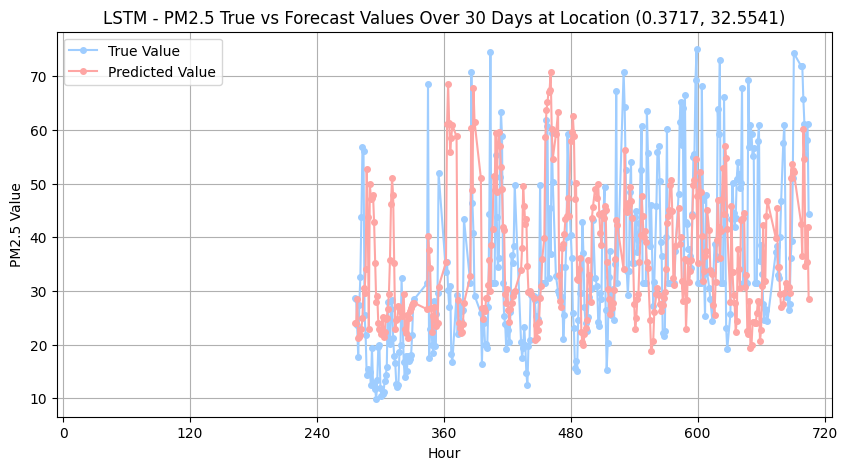

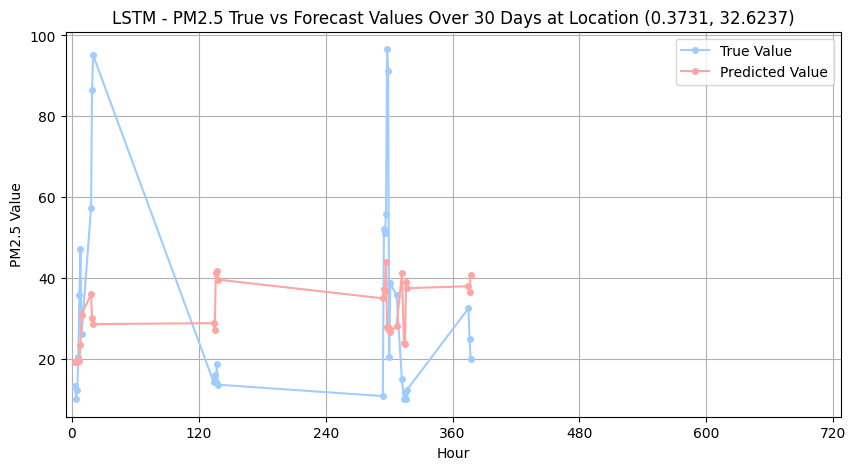

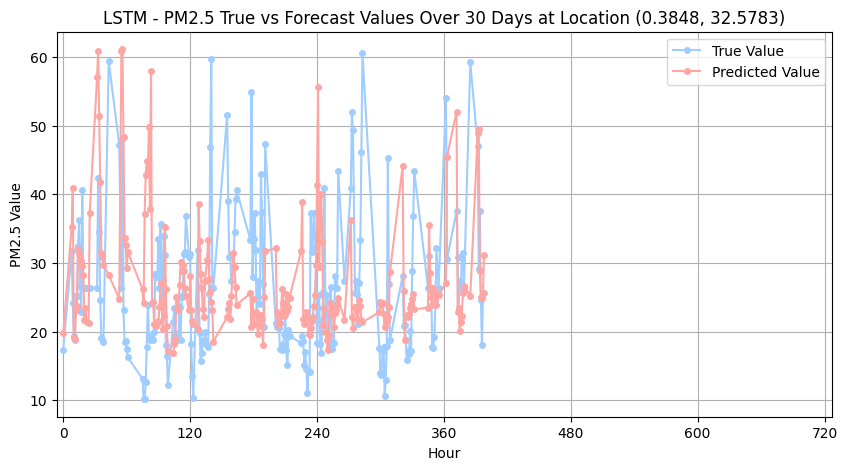

In [114]:
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=30)]
grouped = data_test_day.groupby(['site_latitude', 'site_longitude'])
data_test_day_padded = pd.DataFrame()

for (lat, lon), group in grouped:
    initial_data = group.iloc[0:1]
    padding = pd.concat([initial_data]*sequence_length, ignore_index=True)
    padding.index = pd.date_range(end=initial_data.index[0] - pd.Timedelta(hours=1), periods=sequence_length, freq='h')
    padded_group = pd.concat([padding, group])
    padded_group['site_latitude'] = lat
    padded_group['site_longitude'] = lon
    data_test_day_padded = pd.concat([data_test_day_padded, padded_group])

data_test_day_padded.sort_index(inplace=True)

data_test_day_padded['day'] = data_test_day_padded.index.day 
min_day = data_test_day_padded['day'].min() 
data_test_day_padded['hour'] = (data_test_day_padded['day'] - min_day) * 24 + data_test_day_padded.index.hour



X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day_padded, sequence_length)
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape) 


test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False, drop_last=True)

offset = 0
all_predictions = []
all_targets = []
all_locations = []
all_hours = []

test_day_losses, test_day_mae, test_day_mape = [], [], []

model.eval()        
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)

        outputs = outputs.squeeze()

        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        all_targets.extend(targets.cpu().numpy())
        all_predictions.extend(outputs.cpu().numpy())

        batch_size = inputs.size(0)
        batch_indices = range(offset, offset + batch_size)
        all_locations.extend([locations[i] for i in batch_indices])
        all_hours.extend([hours[i] for i in batch_indices])

        offset += batch_size


print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))


results_df = pd.DataFrame({
    'Latitude': [loc[0] for loc in all_locations],
    'Longitude': [loc[1] for loc in all_locations],
    'True Values': all_targets,
    'Predicted Values': all_predictions,
    'Hour': all_hours
})
grouped = results_df.groupby(['Latitude', 'Longitude'])
for (lat, lon), group in grouped:
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Values'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Values'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')
    plt.title(f"LSTM - PM2.5 True vs Forecast Values Over 30 Days at Location ({lat:.4f}, {lon:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 721, 120))
    plt.xlim(-6, 727)
    plt.legend()
    plt.grid(True)
    plt.show()


